# Kaggle challenge second delivery

## Sources

https://delladata.fr/tutoriel-regression-lineaire-multiple-r/ <br>
https://odr.inra.fr/intranet/carto/cartowiki/index.php/Regression_lin%C3%A9aire_avec_R

## Librairies

In [4]:
#Installer les librairies (Utile seulement la première fois !)
#install.packages("devtools")
#install.packages("RColorBrewer")
#devtools::install_github("hadley/tidyverse")
#install.packages("tidytext")
#install.packages("viridis") 
#install.packages("sqldf")
#install.packages("plotly")# Installer

#Charger les librairies
library("viridis")           
library(RColorBrewer)
library(tidyverse)
library(lubridate)
library(stringr)
library(forcats)
library(tidytext)
library(sqldf)
library(plotly)
library(leaflet)
library(leaflet.extras)
library(ggplot2)
library(wordcloud2)
library(tm)
################################

library(dplyr)
library(tidyr)
library(leaflet)
library(leaflet.extras)
library(grid)
library(gridExtra)
library(scales)
library(knitr)
library(dplyr)
library(ggplot2)
library(readr)
library(stringr)
library(broom)
library(tidytext)
library(tidyr)
library(leaflet)
library(gridExtra)

## Dataset

In [5]:
#Take the dataset
path=file.path("../dataset/Hotel_Reviews.csv")
data=read_csv(path)
head(data)
spec(data)
dataset = read.csv("../dataset/Hotel_Reviews.csv")
sapply(dataset, function(x)sum(is.na(x)))

Rows: 515738 Columns: 17
-- Column specification ------------------------------------------------------------------------------------------------
Delimiter: ","
chr (8): Hotel_Address, Review_Date, Hotel_Name, Reviewer_Nationality, Negat...
dbl (9): Additional_Number_of_Scoring, Average_Score, Review_Total_Negative_...

i Use `spec()` to retrieve the full column specification for this data.
i Specify the column types or set `show_col_types = FALSE` to quiet this message.


Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to begin your holiday So we had to wait till 13 00 in order to check in my new room what a wonderful waist of my time The room 023 i got was just as i wanted to peaceful internal garden view big window We were tired from waiting the room so we placed our belongings and rushed to the city In the evening it turned out that there was a constant noise in the room i guess it was made by vibrating vent tubes or something it was constant and annoying as hell AND it did not stop even at 2 am making it hard to fall asleep for me and my wife I have an audio recording that i can not attach here but if you want i can send it via e mail The next day the technician came but was not able to determine the cause of the disturbing sound so i was offered to change the room once again the hotel was fully booked and they had only 1 room left the one that was smaller but seems newer,397,1403,Only the park outside of the hotel was beautiful,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double Room ', ' Stayed 6 nights ']",0 days,52.36058,4.915968
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great location surroundings rooms amenities and service Two recommendations however firstly the staff upon check in are very confusing regarding deposit payments and the staff offer you upon checkout to refund your original payment and you can make a new one Bit confusing Secondly the on site restaurant is a bit lacking very well thought out and excellent quality food for anyone of a vegetarian or vegan background but even a wrap or toasted sandwich option would be great Aside from those minor minor things fantastic spot and will be back when i return to Amsterdam,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double Room ', ' Stayed 4 nights ']",0 days,52.36058,4.915968
s Gravesandestraat 55 Oost 1092 AA Amsterdam Netherlands,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficult as most rooms are two story with narrow steps So ask for single level Inside the rooms are very very basic just tea coffee and boiler and no bar empty fridge,42,1403,Location was good and staff were ok It is cute hotel the breakfast range is nice Will go back,21,9,7.1,"[' Leisure trip ', ' Family with young children ', ' Duplex Double Room ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",3 days,52.36058,4.915968
s Gravesandestraat 55 Oost 1092 AA Amsterdam Nether

cols(
  Hotel_Address = col_character(),
  Additional_Number_of_Scoring = col_double(),
  Review_Date = col_character(),
  Average_Score = col_double(),
  Hotel_Name = col_character(),
  Reviewer_Nationality = col_character(),
  Negative_Review = col_character(),
  Review_Total_Negative_Word_Counts = col_double(),
  Total_Number_of_Reviews = col_double(),
  Positive_Review = col_character(),
  Review_Total_Positive_Word_Counts = col_double(),
  Total_Number_of_Reviews_Reviewer_Has_Given = col_double(),
  Reviewer_Score = col_double(),
  Tags = col_character(),
  days_since_review = col_character(),
  lat = col_double(),
  lng = col_double()
)

Hotel_Address 
                                         0 
              Additional_Number_of_Scoring 
                                         0 
                               Review_Date 
                                         0 
                             Average_Score 
                                         0 
                                Hotel_Name 
                                         0 
                      Reviewer_Nationality 
                                         0 
                           Negative_Review 
                                         0 
         Review_Total_Negative_Word_Counts 
                                         0 
                   Total_Number_of_Reviews 
                                         0 
                           Positive_Review 
                                         0 
         Review_Total_Positive_Word_Counts 
                                         0 
Total_Number_of_Reviews_Reviewer_Has_Given 
                                         0 
                            Reviewer_Score 
                                         0 
                                      Tags 
                                         0 
                         days_since_review 
                                         0 
                                       lat 
                                      3268 
                                       lng 
                                      3268

In [6]:
#Clean the dataset
# can only run once without getting lat & lng errors!
dataset <- dataset %>%
  select(colnames(dataset),-lat, -lng, -Additional_Number_of_Scoring) %>%
  mutate(Positive_Review = ifelse(is.na(Positive_Review),
                                  "Nothing",
                                  Positive_Review)) %>%
  mutate(Negative_Review = ifelse(is.na(Negative_Review),
                                  "Nothing",
                                  Negative_Review))
sapply(dataset, function(x)sum(is.na(x)))
       
dataset_clean <- dataset
    #dataset_clean %>%
    dataset_clean$Country=sapply(str_split(dataset_clean$Hotel_Address," "),function(x){x[length(x)]})
    dataset_clean$city=sapply(str_split(dataset_clean$Hotel_Address," "),function(x){x[length(x)-1]})
    ## Remove the mention of "United" as "London" in the city column and "Kingdom" as "United Kingdom" in the country column
    dataset_clean$city=str_replace(dataset_clean$city,"United","London")
    dataset_clean$Country=str_replace(dataset_clean$Country,"Kingdom","United Kingdom")
       
dataset_clean <- dataset_clean %>%
  mutate(Review_Date = lubridate::mdy(Review_Date))
#summary(df)
# Time Series Analysis
# is the score dependent on time of year?
dataset_clean <- dataset_clean %>%
  mutate(Year = year(Review_Date)) %>%
  mutate(Month = month(Review_Date))
       
dataset_nlp <- dataset_clean %>%
  select(Hotel_Name, Country, Review_Date, Year, Month,
         Total_Number_of_Reviews_Reviewer_Has_Given, Negative_Review, Reviewer_Nationality,
         Positive_Review,Total_Number_of_Reviews_Reviewer_Has_Given, Tags, Reviewer_Score,Total_Number_of_Reviews,
        Review_Total_Positive_Word_Counts, Review_Total_Negative_Word_Counts)
dataset_clean <- dataset_clean %>%
  select(Hotel_Name, Country, Review_Date, Year, Month, Average_Score,
         Reviewer_Nationality,Reviewer_Score,Total_Number_of_Reviews_Reviewer_Has_Given, Negative_Review,
         Positive_Review,Total_Number_of_Reviews,
        Review_Total_Positive_Word_Counts, Review_Total_Negative_Word_Counts)

write.csv(dataset_clean,"datacleaned.csv", row.names = FALSE)
print("Our dataset cleaned:" )
head(dataset_clean)
print("First column of NLP:" )
head(dataset_nlp, n = 1)
       
dataset_clean <- dataset_clean %>%
  mutate(Reviewer_Nationality = trimws(dataset_clean$Reviewer_Nationality, which = "both"))

Hotel_Address 
                                         0 
                               Review_Date 
                                         0 
                             Average_Score 
                                         0 
                                Hotel_Name 
                                         0 
                      Reviewer_Nationality 
                                         0 
                           Negative_Review 
                                         0 
         Review_Total_Negative_Word_Counts 
                                         0 
                   Total_Number_of_Reviews 
                                         0 
                           Positive_Review 
                                         0 
         Review_Total_Positive_Word_Counts 
                                         0 
Total_Number_of_Reviews_Reviewer_Has_Given 
                                         0 
                            Reviewer_Score 
                                         0 
                                      Tags 
                                         0 
                         days_since_review 
                                         0

[1] "Our dataset cleaned:"


,Hotel_Name,Country,Review_Date,Year,Month,Average_Score,Reviewer_Nationality,Reviewer_Score,Total_Number_of_Reviews_Reviewer_Has_Given,Negative_Review,Positive_Review,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Review_Total_Negative_Word_Counts
,<chr>,<chr>,<date>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<int>,<int>
1,Hotel Arena,Netherlands,2017-08-03,2017,8,7.7,Russia,2.9,7,I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to begin your holiday So we had to wait till 13 00 in order to check in my new room what a wonderful waist of my time The room 023 i got was just as i wanted to peaceful internal garden view big window We were tired from waiting the room so we placed our belongings and rushed to the city In the evening it turned out that there was a constant noise in the room i guess it was made by vibrating vent tubes or something it was constant and annoying as hell AND it did not stop even at 2 am making it hard to fall asleep for me and my wife I have an audio recording that i can not attach here but if you want i can send it via e mail The next day the technician came but was not able to determine the cause of the disturbing sound so i was offered to change the room once again the hotel was fully booked and they had only 1 room left the one that was smaller but seems newer,Only the park outside of the hotel was beautiful,1403,11,397
2,Hotel Arena,Netherlands,2017-08-03,2017,8,7.7,Ireland,7.5,7,No Negative,No real complaints the hotel was great great location surroundings rooms amenities and service Two recommendations however firstly the staff upon check in are very confusing regarding deposit payments and the staff offer you upon checkout to refund your original payment and you can make a new one Bit confusing Secondly the on site restaurant is a bit lacking very well thought out and excellent quality food for anyone of a vegetarian or vegan background but even a wrap or toasted sandwich option would be great Aside from those minor minor things fantastic spot and will be back when i return to Amsterdam,1403,105,0
3,Hotel Arena,Netherlands,2017-07-31,2017,7,7.7,Australia,7.1,9,Rooms are nice but for elderly a bit difficult as most rooms are two story with narrow steps So ask for single level Inside the rooms are very very basic just tea coffee and boiler and no bar empty fridge,Location was good and staff were ok It is cute hotel the breakfast range is nice Will go back,1403,21,42
4,Hotel Arena,Netherlands,2017-07-31,2017,7,7.7,United Kingdom,3.8,1,My room was dirty and I was afraid to walk barefoot on the floor which looked as if it was not cleaned in weeks White furniture which looked nice in pictures was dirty too and the door looked like it was attacked by an angry dog My shower drain was clogged and the staff did not respond to my request to clean it On a day with heavy rainfall a pretty common occurrence in Amsterdam the roof in my room was leaking luckily not on the bed you could also see signs of earlier water damage I also saw insects running on the floor Overal

[1] "First column of NLP:"


,Hotel_Name,Country,Review_Date,Year,Month,Total_Number_of_Reviews_Reviewer_Has_Given,Negative_Review,Reviewer_Nationality,Positive_Review,Tags,Reviewer_Score,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Review_Total_Negative_Word_Counts
,<chr>,<chr>,<date>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>
1,Hotel Arena,Netherlands,2017-08-03,2017,8,7,I am so angry that i made this post available via all possible sites i use when planing my trips so no one will make the mistake of booking this place I made my booking via booking com We stayed for 6 nights in this hotel from 11 to 17 July Upon arrival we were placed in a small room on the 2nd floor of the hotel It turned out that this was not the room we booked I had specially reserved the 2 level duplex room so that we would have a big windows and high ceilings The room itself was ok if you don t mind the broken window that can not be closed hello rain and a mini fridge that contained some sort of a bio weapon at least i guessed so by the smell of it I intimately asked to change the room and after explaining 2 times that i booked a duplex btw it costs the same as a simple double but got way more volume due to the high ceiling was offered a room but only the next day SO i had to check out the next day before 11 o clock in order to get the room i waned to Not the best way to begin your holiday So we had to wait till 13 00 in order to check in my new room what a wonderful waist of my time The room 023 i got was just as i wanted to peaceful internal garden view big window We were tired from waiting the room so we placed our belongings and rushed to the city In the evening it turned out that there was a constant noise in the room i guess it was made by vibrating vent tubes or something it was constant and annoying as hell AND it did not stop even at 2 am making it hard to fall asleep for me and my wife I have an audio recording that i can not attach here but if you want i can send it via e mail The next day the technician came but was not able to determine the cause of the disturbing sound so i was offered to change the room once again the hotel was fully booked and they had only 1 room left the one that was smaller but seems newer,Russia,Only the park outside of the hotel was beautiful,"[' Leisure trip ', ' Couple ', ' Duplex Double Room ', ' Stayed 6 nights ']",2.9,1403,11,397


## Linear Regression

In [7]:
# Variables explicatives : 
#x1 = Nationalité du reviewer, x2 = Pays de l'hotel, x3 = Nombre de mots positifs, x4 = Nombre de mots négatifs
gradereg<-lm(Reviewer_Score ~ Reviewer_Nationality + Country + Review_Total_Positive_Word_Counts + Review_Total_Negative_Word_Counts, data=dataset_clean)

In [8]:
#### Regression output
summary(gradereg)


Call:
lm(formula = Reviewer_Score ~ Reviewer_Nationality + Country + 
    Review_Total_Positive_Word_Counts + Review_Total_Negative_Word_Counts, 
    data = dataset_clean)

Residuals:
    Min      1Q  Median      3Q     Max 
-13.255  -0.756   0.340   1.038   9.973 

Coefficients:
                                                           Estimate Std. Error
(Intercept)                                               8.359e+00  6.307e-02
Reviewer_NationalityAbkhazia Georgia                      1.901e-01  1.316e-01
Reviewer_NationalityAfghanistan                          -1.281e+00  5.102e-01
Reviewer_NationalityAlbania                               8.120e-02  1.054e-01
Reviewer_NationalityAlgeria                              -3.512e-01  1.563e-01
Reviewer_NationalityAmerican Samoa                       -2.128e+00  1.015e+00
Reviewer_NationalityAndorra                              -1.619e-01  1.897e-01
Reviewer_NationalityAngola                               -6.692e-02  1.923e-01
Reviewe

In [9]:
#### Extraction des coefficients
coef(gradereg)

(Intercept) 
                                             8.358954239 
                    Reviewer_NationalityAbkhazia Georgia 
                                             0.190070842 
                         Reviewer_NationalityAfghanistan 
                                            -1.280632330 
                             Reviewer_NationalityAlbania 
                                             0.081200182 
                             Reviewer_NationalityAlgeria 
                                            -0.351248194 
                      Reviewer_NationalityAmerican Samoa 
                                            -2.127933710 
                             Reviewer_NationalityAndorra 
                                            -0.161940801 
                              Reviewer_NationalityAngola 
                                            -0.066915782 
                            Reviewer_NationalityAnguilla 
                                            -0.767651064 
                          Reviewer_NationalityAntarctica 
                                             0.011112930 
                     Reviewer_NationalityAntigua Barbuda 
                                            -0.017462275 
                           Reviewer_NationalityArgentina 
                                             0.298683089 
                             Reviewer_NationalityArmenia 
                                            -0.012519322 
                               Reviewer_NationalityAruba 
                                            -0.007819388 
                           Reviewer_NationalityAustralia 
                                             0.390305512 
                             Reviewer_NationalityAustria 
                                             0.161269929 
                          Reviewer_NationalityAzerbaijan 
                                            -0.274504449 
                             Reviewer_NationalityBahamas 
                                             0.302563054 
                             Reviewer_NationalityBahrain 
                                            -0.137541629 
                          Reviewer_NationalityBangladesh 
                                            -0.490911848 
                            Reviewer_NationalityBarbados 
                                             0.267017195 
                             Reviewer_NationalityBelarus 
                                            -0.043551314 
                             Reviewer_NationalityBelgium 
                                             0.091105510 
                              Reviewer_NationalityBelize 
                                             0.557048352 
                               Reviewer_NationalityBenin 
                                             0.964158302 
                             Reviewer_NationalityBermuda 
                                             0.556205427 
                              Reviewer_NationalityBhutan 
                                             0.665398130 
                             Reviewer_NationalityBolivia 
                                             0.548969757 
       Reviewer_NationalityBonaire St Eustatius and Saba 
                                             0.714123790 
              Reviewer_NationalityBosnia and Herzegovina 
                                             0.087981103 
                            Reviewer_NationalityBotswana 
                                             0.152839107 
                              Reviewer_NationalityBrazil 
                                             0.290869544 
              Reviewer_NationalityBritish Virgin Islands 
                                             0.251303367 
                              Reviewer_NationalityBrunei 
                                             0.134110244 
                            Reviewer_NationalityBulgaria 
                                           

In [10]:
#### Intervalle de confiance (à 95%) des coefficients
confint(gradereg)

,2.5 %,97.5 %
(Intercept),8.23533327,8.482575212
Reviewer_NationalityAbkhazia Georgia,-0.06790469,0.448046371
Reviewer_NationalityAfghanistan,-2.28051084,-0.280753816
Reviewer_NationalityAlbania,-0.12528492,0.287685283
Reviewer_NationalityAlgeria,-0.65759698,-0.044899406
Reviewer_NationalityAmerican Samoa,-4.11637220,-0.139495219
Reviewer_NationalityAndorra,-0.53367135,0.209789742
Reviewer_NationalityAngola,-0.44390542,0.310073852
Reviewer_NationalityAnguilla,-3.57705017,2.041748045
Reviewer_NationalityAntarctica,-1.61399560,1.636221456


1            2            3            4            5            6 
-0.448726405 10.633599346  8.075056810  4.372558496  5.647372853  8.309234913 
           7            8            9           10           11           12 
 8.257326089  8.778918285  7.550543712  8.943524615 10.508701355  6.664214556 
          13           14           15           16           17           18 
 8.138358232  9.370005564  8.083654480  9.816774479  8.065498179  8.490463366 
          19           20           21           22           23           24 
 8.907269849  7.891925065  8.078120798  7.655332281  0.680794104  9.082496171 
          25           26           27           28           29           30 
11.117670270  8.328839917 10.099731117  7.707398947  8.012223647  8.946198811 
          31           32           33           34           35           36 
 8.978114160  7.579354396  7.242492562  8.951939823  8.822767431  9.197328538 
          37           38           39           40           41           42 
 8.396809927  8.825278759 10.151134027  6.097810432  7.629056936  6.459383497 
          43           44           45           46           47           48 
 6.120644950  8.765314052  8.414847986  7.366233266  1.529081247  8.346666037 
          49           50           51           52           53           54 
10.156636672  6.914338218  8.756548709  6.380772121  9.414732416  9.612744079 
          55           56           57           58           59           60 
 8.016882268 10.137211936  7.550708100  8.582182306  8.302977677  9.971788999 
          61           62           63           64           65           66 
 5.054675030  8.162468173  8.643857571  7.802174689  8.784738788  7.932926089 
          67           68           69           70           71           72 
 8.291792888  9.538759875  7.558299329  8.523908100  7.520292253  8.164763204 
          73           74           75           76           77           78 
 7.881756533  7.974651222  5.453154528  9.748717227  8.340845534  8.321530430 
          79           80           81           82           83           84 
 9.981814053  9.321373047  7.937387723  9.529680852  7.184805617  7.850844476 
          85           86           87           88           89           90 
 7.798568892  9.247531381  7.759997518  7.362281248  8.565702412  8.345228206 
          91           92           93           94           95           96 
 5.659879635  7.799550506  7.799372385  3.903247786  7.539698971  9.928834953 
          97           98           99          100          101          102 
 9.399071989  8.516649767  6.104443152  7.838787705  7.786749767  7.926580190 
         103          104          105          106          107          108 
 6.913185855  8.300895302  8.671591433  9.039384362  8.298764401  7.724253674 
         109          110          111          112          113          114 
 8.779374502  8.472961407  8.186812123 10.073734230 10.894776619  9.321373047 
         115          116          117          118          119          120 
10.176061407  7.055504902  7.867849766  9.481779216  6.972735745  8.321590194 
         121          122          123          124          125          126 
 7.648287994  7.904440578  8.086318742  8.728814846  5.834500535  8.718680851 
         127          128          129          130          131          132 
 7.717290772  8.171843417  8.909687933  7.847899634  8.657987201  7.962190749 
         133          134          135          136          137          138 
 6.555125408  8.120827544  4.517177842  8.838922152  8.426328206  8.245685084 
         139          140          141          142          143          144 
 8.473417624  8.596311936  9.437921460  9.103318285  8.738105587  7.887452622 
         145          146          147          148          149          150 
 7.820682612  8.228679793  4.209902279  8.290355058  8.574051991  9.682977149 
         151          152          153          154          

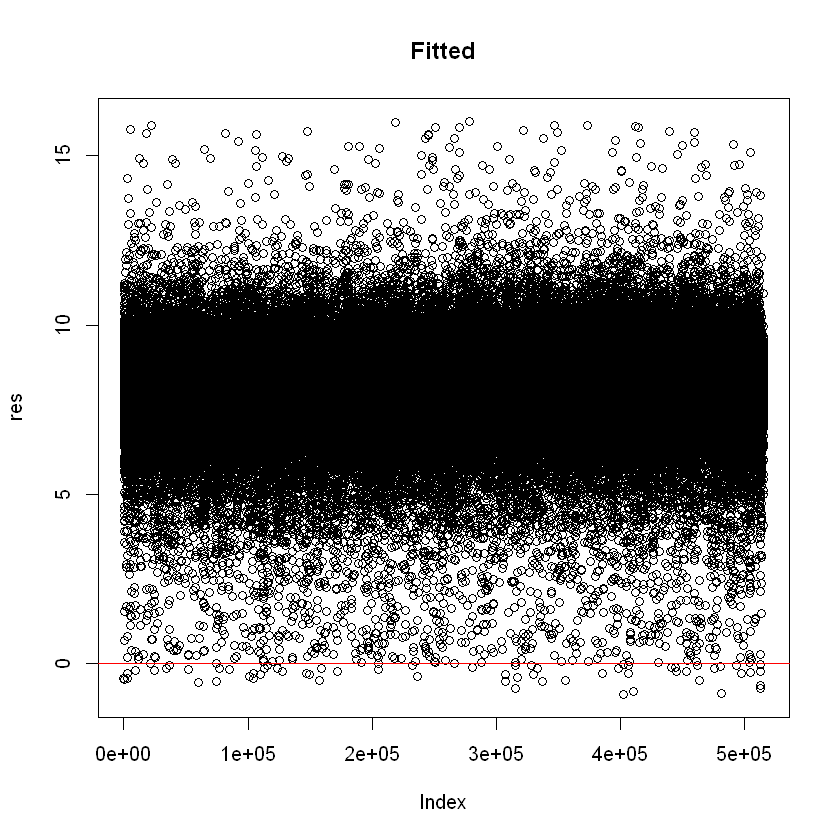

In [23]:
#### Extraction des valeurs prédites
fitted(gradereg)
res<-fitted(gradereg)
plot(res,main="Fitted")
abline(h=0,col="red")

In [13]:
#### Extraction des résidus
resid(gradereg)

1             2             3             4             5 
 3.348726e+00 -3.133599e+00 -9.750568e-01 -5.725585e-01  1.052627e+00 
            6             7             8             9            10 
-1.609235e+00 -3.657326e+00  1.221082e+00 -1.050544e+00 -1.043525e+00 
           11            12            13            14            15 
-5.087014e-01 -8.642146e-01 -3.538358e+00 -1.700056e-01  7.163455e-01 
           16            17            18            19            20 
 1.832255e-01 -1.765498e+00 -9.904634e-01 -1.807270e+00 -3.919251e-01 
           21            22            23            24            25 
-1.778121e+00 -3.855332e+00  4.719206e+00  5.175038e-01 -1.517670e+00 
           26            27            28            29            30 
-2.883992e-02 -4.997311e-01  5.926011e-01  2.877764e-01  2.538012e-01 
           31            32            33            34            35 
 2.218858e-01 -4.793544e-01 -3.042493e+00 -2.251940e+00 -9.227674e-01 
           36            37            38            39            40 
-8.973285e-01 -1.296810e+00 -2.527876e-02 -1.351134e+00  2.021896e-01 
           41            42            43            44            45 
-1.290569e-01  2.406165e-01 -3.220645e+00  8.346859e-01 -5.114848e+00 
           46            47            48            49            50 
 5.337667e-01  2.670919e+00 -4.666604e-02 -1.566367e-01 -1.514338e+00 
           51            52            53            54            55 
 8.434513e-01  7.192279e-01  5.852676e-01  3.872559e-01 -1.168823e-01 
           56            57            58            59            60 
-1.372119e-01 -4.507081e-01 -6.821823e-01 -4.029777e-01 -3.717890e-01 
           61            62            63            64            65 
-4.546750e-01 -1.062468e+00 -3.438576e-01 -1.502175e+00  4.152612e-01 
           66            67            68            69            70 
 8.670739e-01  9.082071e-01 -2.038760e+00  3.417007e-01  2.760919e-01 
           71            72            73            74            75 
-8.202923e-01 -1.064763e+00 -7.817565e-01 -1.674651e+00  1.646845e+00 
           76            77            78            79            80 
 2.512828e-01 -1.240846e+00 -8.215304e-01 -7.818141e-01 -1.213730e-01 
           81            82            83            84            85 
-2.537388e+00  4.703191e-01 -1.384806e+00  1.349156e+00  1.014311e-01 
           86            87            88            89            90 
 7.524686e-01 -2.599975e-01 -1.562281e+00 -2.765702e+00 -8.452282e-01 
           91            92            93            94            95 
-1.459880e+00 -6.995505e-01 -2.799372e+00  2.967522e-01 -8.396990e-01 
           96            97            98            99           100 
-3.288350e-01  6.009280e-01  2.833502e-01 -1.104443e+00 -1.538788e+00 
          101           102           103           104           105 
-2.786750e+00 -3.326580e+00  1.886814e+00  8.991047e-01 -7.715914e-01 
          106           107           108           109           110 
 9.606156e-01 -1.198764e+00 -3.924254e+00  8.206255e-01  3.270386e-01 
          111           112           113           114           115 
-2.868121e-01 -3.773734e+00 -8.947766e-01  2.786270e-01 -1.376061e+00 
          116           117           118           119           120 
 4.449510e-02  1.332150e+00 -6.817792e-01  9.272643e-01 -8.215902e-01 
          121           122           123           124           125 
-3.048288e+00  3.955594e-01 -3.886319e+00 -1.228815e+00 -1.234501e+00 
          126           127           128           129           130 
-1.218681e+00 -1.917291e+00  1.028157e+00 -1.096879e-01  5.210037e-02 
          131           132           133           134           135 
-7.579872e-01  3.378093e-01  5.448746e-01  1.879172e+00  8.282216e-02 
          136           137           138           139           140 
 7.610778e-01  1.573672e+00  9.543149e-01 -2.173418e+00 -1.896312e+00 
          141           142         

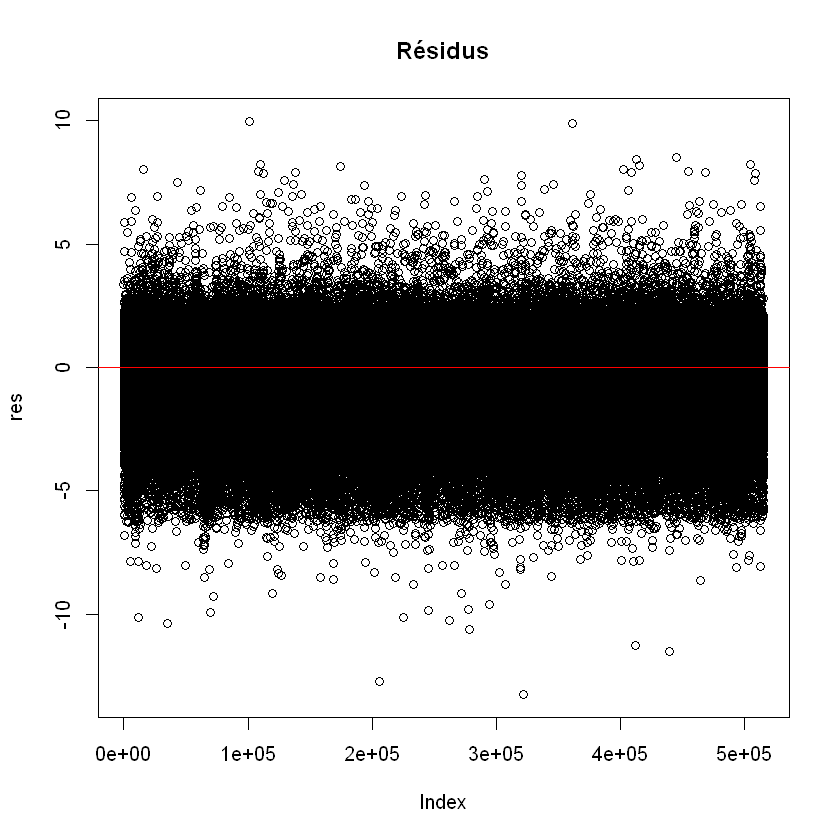

In [14]:
#### résidus
res<-resid(gradereg)
plot(res,main="Résidus")
abline(h=0,col="red")

In [18]:
#install.packages("performance")
library(performance)
check_collinearity(gradereg)

,Term,VIF,SE_factor
,<chr>,<dbl>,<dbl>
1,Reviewer_Nationality,1.319220,1.148573
2,Country,1.307366,1.143401
3,Review_Total_Positive_Word_Counts,1.030859,1.015312
4,Review_Total_Negative_Word_Counts,1.018494,1.009205


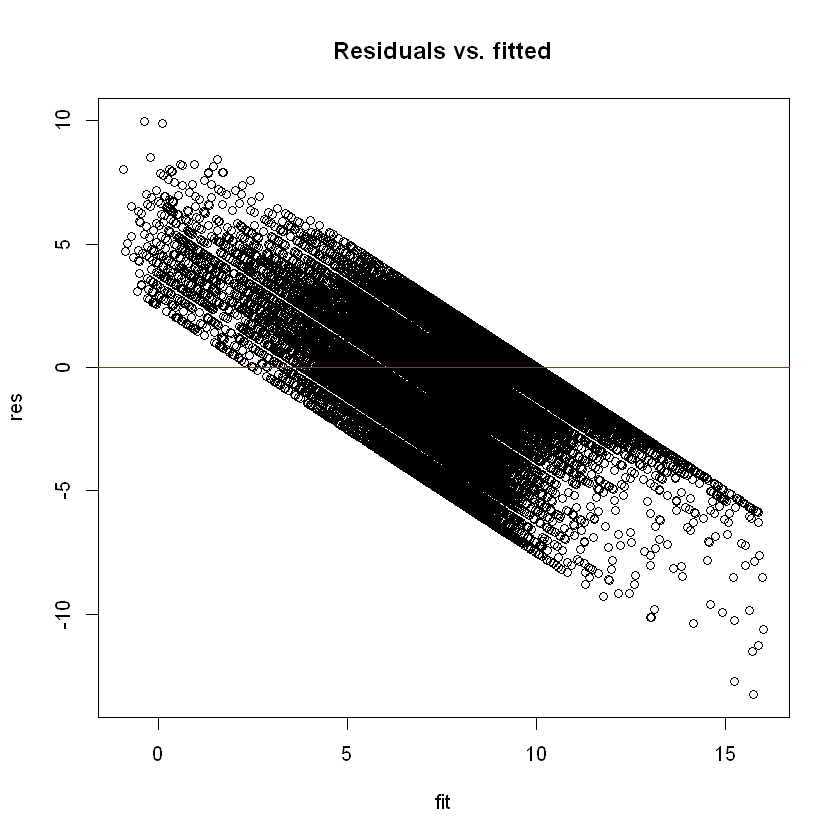

In [28]:
# Extraction des valeurs prédites
fit<-fitted(gradereg)
res<-resid(gradereg)

## residus vs. valeurs prédites
plot(fit,res,main="Residuals vs. fitted")
abline(h=0,col="red")

## Only Country

In [20]:
gradereg.country <-lm(Reviewer_Score ~ Reviewer_Nationality + Country, data=dataset_clean)

In [21]:
summary(gradereg.country)
coef(gradereg.country)
confint(gradereg.country)
fitted(gradereg.country)
resid(gradereg.country)


Call:
lm(formula = Reviewer_Score ~ Reviewer_Nationality + Country, 
    data = dataset_clean)

Residuals:
    Min      1Q  Median      3Q     Max 
-6.4897 -0.9138  0.4603  1.2181  3.3796 

Coefficients:
                                                          Estimate Std. Error
(Intercept)                                               8.257151   0.071229
Reviewer_NationalityAbkhazia Georgia                      0.324148   0.148691
Reviewer_NationalityAfghanistan                          -1.220146   0.576313
Reviewer_NationalityAlbania                               0.121181   0.119014
Reviewer_NationalityAlgeria                              -0.293109   0.176573
Reviewer_NationalityAmerican Samoa                       -2.515658   1.146102
Reviewer_NationalityAndorra                              -0.056365   0.214259
Reviewer_NationalityAngola                                0.065217   0.217289
Reviewer_NationalityAnguilla                             -0.757151   1.619290
Reviewer_Nation

(Intercept) 
                                             8.257151224 
                    Reviewer_NationalityAbkhazia Georgia 
                                             0.324148404 
                         Reviewer_NationalityAfghanistan 
                                            -1.220145590 
                             Reviewer_NationalityAlbania 
                                             0.121181206 
                             Reviewer_NationalityAlgeria 
                                            -0.293108952 
                      Reviewer_NationalityAmerican Samoa 
                                            -2.515657770 
                             Reviewer_NationalityAndorra 
                                            -0.056364793 
                              Reviewer_NationalityAngola 
                                             0.065216937 
                            Reviewer_NationalityAnguilla 
                                            -0.757151224 
                          Reviewer_NationalityAntarctica 
                                             0.632210727 
                     Reviewer_NationalityAntigua Barbuda 
                                             0.090935646 
                           Reviewer_NationalityArgentina 
                                             0.371954340 
                             Reviewer_NationalityArmenia 
                                            -0.005867938 
                               Reviewer_NationalityAruba 
                                             0.350547289 
                           Reviewer_NationalityAustralia 
                                             0.558901066 
                             Reviewer_NationalityAustria 
                                             0.197303056 
                          Reviewer_NationalityAzerbaijan 
                                            -0.172636989 
                             Reviewer_NationalityBahamas 
                                             0.568284682 
                             Reviewer_NationalityBahrain 
                                            -0.085948045 
                          Reviewer_NationalityBangladesh 
                                            -0.422578923 
                            Reviewer_NationalityBarbados 
                                             0.538806273 
                             Reviewer_NationalityBelarus 
                                             0.082760536 
                             Reviewer_NationalityBelgium 
                                             0.131697112 
                              Reviewer_NationalityBelize 
                                             0.303370344 
                               Reviewer_NationalityBenin 
                                             1.183422337 
                             Reviewer_NationalityBermuda 
                                             0.650194994 
                              Reviewer_NationalityBhutan 
                                             0.916661559 
                             Reviewer_NationalityBolivia 
                                             0.646025512 
       Reviewer_NationalityBonaire St Eustatius and Saba 
                                             0.987049224 
              Reviewer_NationalityBosnia and Herzegovina 
                                             0.193516071 
                            Reviewer_NationalityBotswana 
                                             0.219431476 
                              Reviewer_NationalityBrazil 
                                             0.376051758 
              Reviewer_NationalityBritish Virgin Islands 
                                             0.432763201 
                              Reviewer_NationalityBrunei 
                                             0.465049940 
                            Reviewer_NationalityBulgaria 
                                           

,2.5 %,97.5 %
(Intercept),8.117545494,8.39675695
Reviewer_NationalityAbkhazia Georgia,0.032718908,0.61557790
Reviewer_NationalityAfghanistan,-2.349700868,-0.09059031
Reviewer_NationalityAlbania,-0.112083244,0.35444566
Reviewer_NationalityAlgeria,-0.639187054,0.05296915
Reviewer_NationalityAmerican Samoa,-4.761981518,-0.26933402
Reviewer_NationalityAndorra,-0.476305680,0.36357609
Reviewer_NationalityAngola,-0.360663590,0.49109746
Reviewer_NationalityAnguilla,-3.930907844,2.41660540
Reviewer_NationalityAntarctica,-1.203658118,2.46807957


1         2         3         4         5         6         7         8 
 8.264668  8.530290  8.638519  8.604331  8.714517  8.223325  8.604331  8.604331 
        9        10        11        12        13        14        15        16 
 8.211315  8.195568  8.604331  8.178318  8.604331  8.142271  8.575920  8.142271 
       17        18        19        20        21        22        23        24 
 8.604331  8.530290  8.153457  8.638519  8.604331  8.178318  8.150660  8.530290 
       25        26        27        28        29        30        31        32 
 8.604331  8.812194  8.604331  8.178318  8.812194  8.444660  8.530290  8.604331 
       33        34        35        36        37        38        39        40 
 8.812194  8.153457  8.812194  8.699860  8.530290  8.264668  8.604331  8.575920 
       41        42        43        44        45        46        47        48 
 8.150660  8.604331  8.197493  8.604331  8.812194  7.907206  8.604331  8.604331 
       49        50        51        52        53        54        55        56 
 8.604331  7.917106  8.604331  8.604331  8.153457  8.604331  8.223325  8.604331 
       57        58        59        60        61        62        63        64 
 8.604331  8.604331  8.604331  8.197493  8.231306  8.117697  8.604331  8.412097 
       65        66        67        68        69        70        71        72 
 8.604331  8.604331  8.604331  8.412097  7.917106  8.604331  8.150660  8.197493 
       73        74        75        76        77        78        79        80 
 8.117697  8.604331  8.604331  8.604331  8.604331  8.530290  8.604331  8.604331 
       81        82        83        84        85        86        87        88 
 8.251156  8.604331  8.211315  8.604331  8.197493  8.604331  8.604331  8.604331 
       89        90        91        92        93        94        95        96 
 8.604331  8.604331  8.178318  8.197493  8.604331  8.312489  8.083299  8.604331 
       97        98        99       100       101       102       103       104 
 8.604331  8.604331  8.604331  8.530290  8.604331  8.604331  8.153457  8.638519 
      105       106       107       108       109       110       111       112 
 8.604331  8.812194  8.575920  8.812194  8.604331  8.604331  8.412097  8.812194 
      113       114       115       116       117       118       119       120 
 8.604331  8.604331  8.604331  8.153457  8.604331  8.575920  8.604331  8.575920 
      121       122       123       124       125       126       127       128 
 8.604331  8.812194  8.238794  8.604331  8.530290  8.604331  8.604331  8.604331 
      129       130       131       132       133       134       135       136 
 8.812194  8.604331  8.604331  8.153457  8.195568  8.604331  8.638519  8.211315 
      137       138       139       140       141       142       143       144 
 8.604331  8.604331  8.604331  8.604331  8.604331  8.604331  8.604331  8.197493 
      145       146       147       148       149       150       151       152 
 8.174186  8.604331  8.604331  8.604331  8.530290  8.604331  8.604331  8.604331 
      153       154       155       156       157       158       159       160 
 8.530290  8.604331  8.530290  8.812194  8.604331  8.604331  8.150660  8.312489 
      161       162       163       164       165       166       167       168 
 8.604331  8.604331  8.604331  8.604331  8.604331  8.638519  8.604331  8.604331 
      169       170       171       172       173       174       175       176 
 8.604331  8.604331  8.812194  8.153457  8.604331  8.604331  8.604331  8.604331 
      177       178       179       180       181       182       183       184 
 8.604331  8.604331  8.530290  8.604331  8.604331  8.604331  8.604331  8.502660 
      185       186       187       188       189       190       191       192 
 8.699860  8.604331  8.604331  8.530290  8.604331  8.476062  8.699860  8.264668 
      193       194       195       196       197       198       199       200 
 8.604331  8.604331  8.604331  8.604331

1             2             3             4             5 
-5.364668e+00 -1.030290e+00 -1.538519e+00 -4.804331e+00 -2.014517e+00 
            6             7             8             9            10 
-1.523325e+00 -4.004331e+00  1.395669e+00 -1.711315e+00 -2.955675e-01 
           11            12            13            14            15 
 1.395669e+00 -2.378318e+00 -4.004331e+00  1.057729e+00  2.240796e-01 
           16            17            18            19            20 
 1.857729e+00 -2.304331e+00 -1.030290e+00 -1.053457e+00 -1.138519e+00 
           21            22            23            24            25 
-2.304331e+00 -4.378318e+00 -2.750660e+00  1.069710e+00  9.956688e-01 
           26            27            28            29            30 
-5.121935e-01  9.956688e-01  1.216825e-01 -5.121935e-01  7.553403e-01 
           31            32            33            34            35 
 6.697098e-01 -1.504331e+00 -4.612194e+00 -1.453457e+00 -9.121935e-01 
           36            37            38            39            40 
-3.998602e-01 -1.430290e+00  5.353321e-01  1.956688e-01 -2.275920e+00 
           41            42            43            44            45 
-6.506603e-01 -1.904331e+00 -5.297493e+00  9.956688e-01 -5.512194e+00 
           46            47            48            49            50 
-7.206107e-03 -4.404331e+00 -3.043312e-01  1.395669e+00 -2.517106e+00 
           51            52            53            54            55 
 9.956688e-01 -1.504331e+00  1.846543e+00  1.395669e+00 -3.233251e-01 
           56            57            58            59            60 
 1.395669e+00 -1.504331e+00 -7.043312e-01 -7.043312e-01  1.402507e+00 
           61            62            63            64            65 
-3.631306e+00 -1.017697e+00 -3.043312e-01 -2.112097e+00  5.956688e-01 
           66            67            68            69            70 
 1.956688e-01  5.956688e-01 -9.120971e-01 -1.710555e-02  1.956688e-01 
           71            72            73            74            75 
-1.450660e+00 -1.097493e+00 -1.017697e+00 -2.304331e+00 -1.504331e+00 
           76            77            78            79            80 
 1.395669e+00 -1.504331e+00 -1.030290e+00  5.956688e-01  5.956688e-01 
           81            82            83            84            85 
-2.851156e+00  1.395669e+00 -2.411315e+00  5.956688e-01 -2.974933e-01 
           86            87            88            89            90 
 1.395669e+00 -1.104331e+00 -2.804331e+00 -2.804331e+00 -1.104331e+00 
           91            92            93            94            95 
-3.978318e+00 -1.097493e+00 -3.604331e+00 -4.112489e+00 -1.383299e+00 
           96            97            98            99           100 
 9.956688e-01  1.395669e+00  1.956688e-01 -3.604331e+00 -2.230290e+00 
          101           102           103           104           105 
-3.604331e+00 -4.004331e+00  6.465432e-01  5.614815e-01 -7.043312e-01 
          106           107           108           109           110 
 1.187806e+00 -1.475920e+00 -5.012194e+00  9.956688e-01  1.956688e-01 
          111           112           113           114           115 
-5.120971e-01 -2.512194e+00  1.395669e+00  9.956688e-01  1.956688e-01 
          116           117           118           119           120 
-1.053457e+00  5.956688e-01  2.240796e-01 -7.043312e-01 -1.075920e+00 
          121           122           123           124           125 
-4.004331e+00 -5.121935e-01 -4.038794e+00 -1.104331e+00 -3.930290e+00 
          126           127           128           129           130 
-1.104331e+00 -2.804331e+00  5.956688e-01 -1.219355e-02 -7.043312e-01 
          131           132           133           134           135 
-7.043312e-01  1.465432e-01 -1.095568e+00  1.395669e+00 -4.038519e+00 
          136           137           138           139           140 
 1.388685e+00  1.395669e+00  5.956688e-01 -2.304331e+00 -1.904331e+00 
          141           142         

,Term,VIF,SE_factor
,<chr>,<dbl>,<dbl>
1,Reviewer_Nationality,1.300322,1.140317
2,Country,1.300322,1.140317


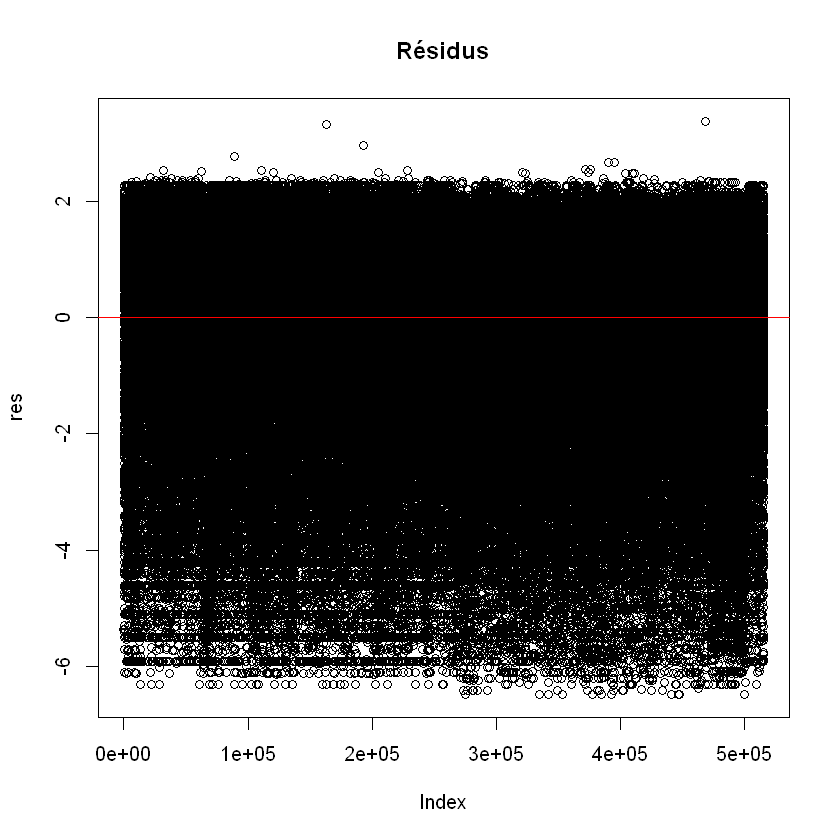

,Term,VIF,SE_factor
,<chr>,<dbl>,<dbl>
1,Reviewer_Nationality,1.300322,1.140317
2,Country,1.300322,1.140317


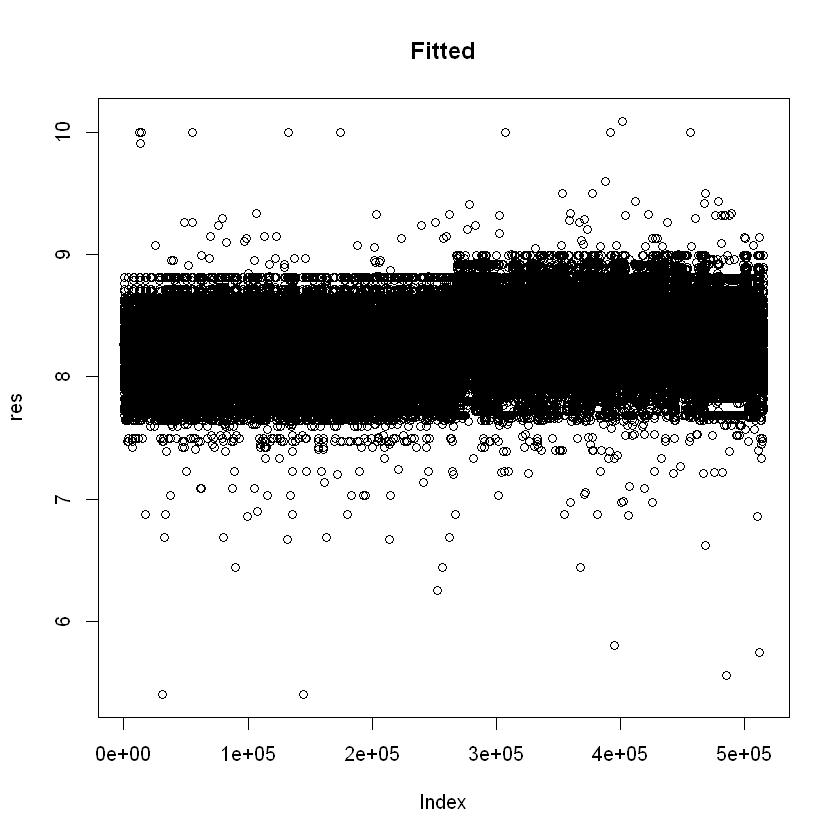

In [24]:
res<-resid(gradereg.country)
plot(res,main="Résidus")
abline(h=0,col="red")
check_collinearity(gradereg.country)

res<-fitted(gradereg.country)
plot(res,main="Fitted")
abline(h=0,col="red")
check_collinearity(gradereg.country)

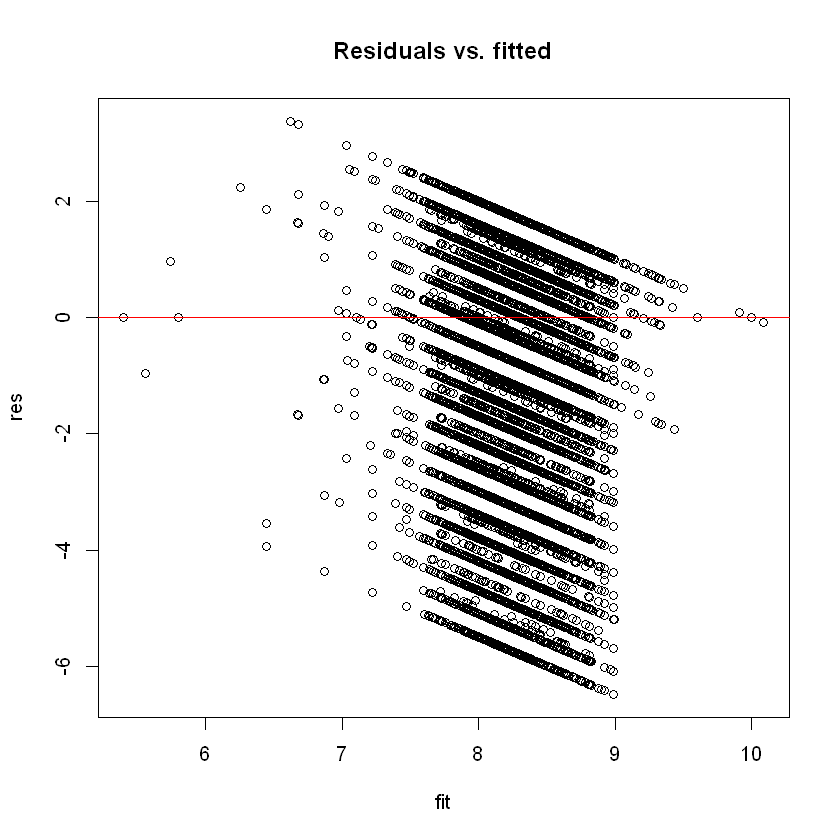

In [27]:
# Extraction des valeurs prédites
fit<-fitted(gradereg.country)
res<-resid(gradereg.country)

## residus vs. valeurs prédites
plot(fit,res,main="Residuals vs. fitted")
abline(h=0,col="red")